In [9]:
import spectral as sp
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import scipy.io
import sys
import os
import pandas as pd

sys.path.append('../')
from preprocessing import *
%matplotlib inline

#### Ws
Wavelengths: wavelengths \
White Image: refIntensity \
hyperspectral image: spectralDataAll (1st dim bands, 2nd dim time)


#### DarkCount
Dark Image: DarkCount


In [7]:
data_folder = "../../datasets/piglet/lwp475"
class_labels = ["Not labled", "Normal", "Tumor", "Hypervasculized", "Background"]

# Load the sp data
img_mat = scipy.io.loadmat('../../datasets/piglet/lwp475/LWP475_Ws_14Nov2016_1.mat')
img_darkcount = scipy.io.loadmat('../../datasets/piglet/lwp475/LWP475_DarkCount_14Nov2016.mat')

wavelengths = img_mat['wavelengths'].astype(float)
white_full = img_mat['refIntensity'].astype(float)
dark_full = img_darkcount['DarkCount'].astype(float)
spectr = img_mat['spectralDataAll'].astype(float)

print(spectr.shape)
print(wavelengths.shape)


(1024, 8806)
(1024, 1)


In [8]:
def plot_spectrum(spectr, wavelengths):
    N,T = spectr.shape

    fig, ax = plt.subplots()
    colors = matplotlib.cm.viridis(np.linspace(0, 1, T))
    for i in range(T):
        ax.plot(wavelengths, spectr[:, i], color=colors[i])
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Intensity')
    # Create a ScalarMappable for the colorbar
    sm = plt.cm.ScalarMappable(cmap=matplotlib.cm.viridis, norm=plt.Normalize(0, T - 1))
    sm.set_array(np.arange(0, T))  # Specify the array directly
    # Add colorbar using the ScalarMappable
    cbar = plt.colorbar(sm, ax=ax, ticks=np.arange(0, T, 1000))
    cbar.set_label('Time')

    return fig, ax


### Plot all raw spectra from the dataset

Loading LWP475_Ws_14Nov2016_1.mat


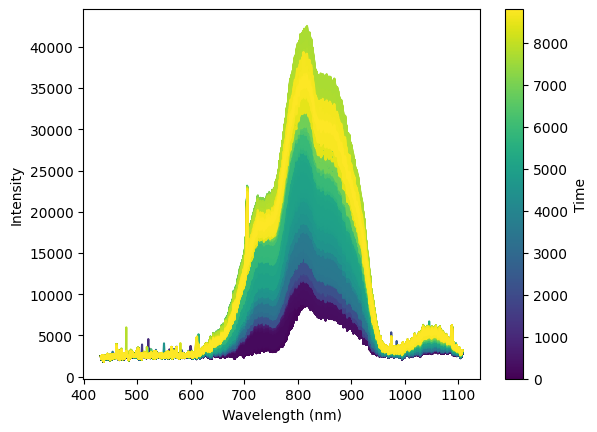

Loading LWP474_Ws_07Nov2016.mat


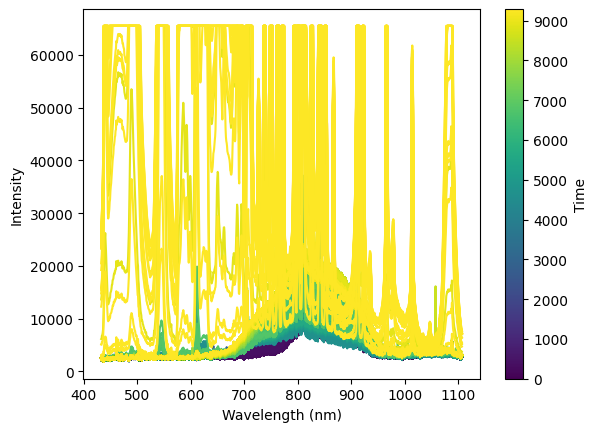

Loading LWP479_Ws_05Dec2016.mat


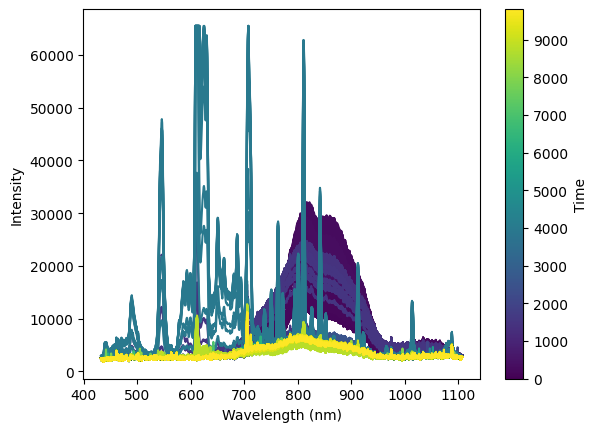

Loading LWP479_Ws_06Dec2016.mat


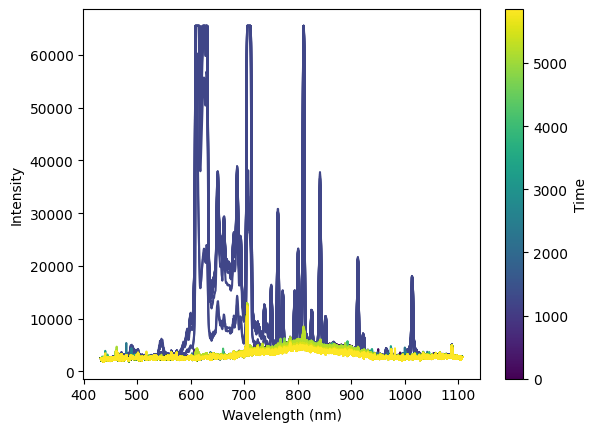

Loading LWP479_Ws_07Dec2016.mat


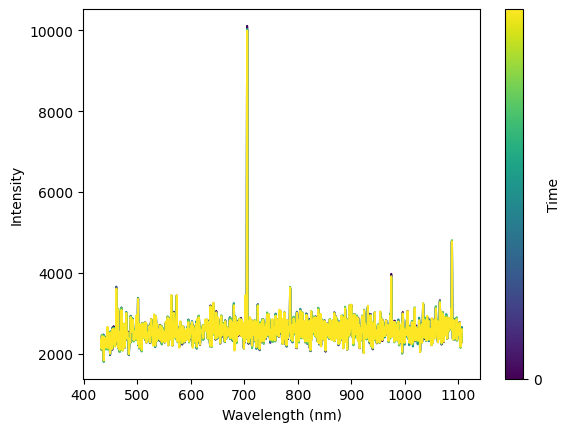

Loading LWP480_Ws_12Dec2016.mat


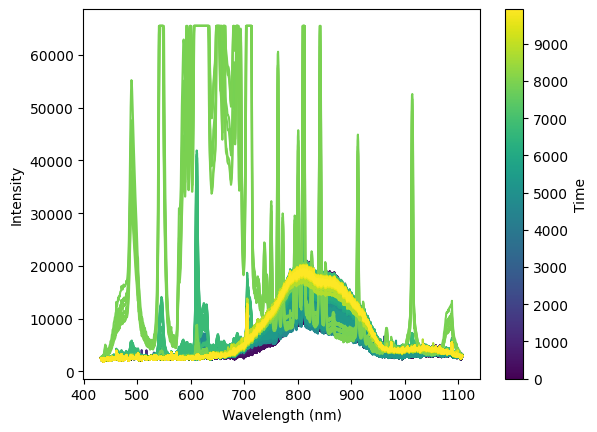

Loading LWP480_Ws_13Dec2016.mat


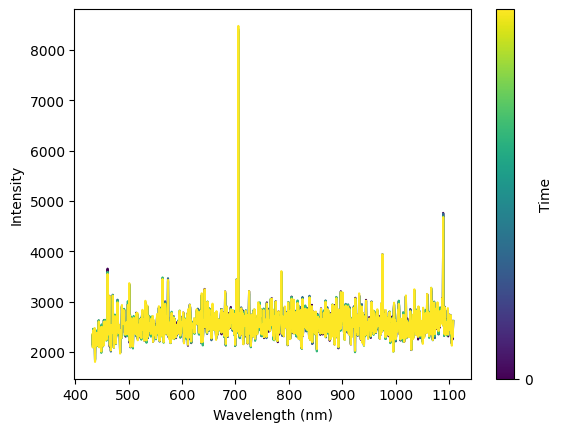

Loading LWP480_Ws_13Dec2016_2.mat


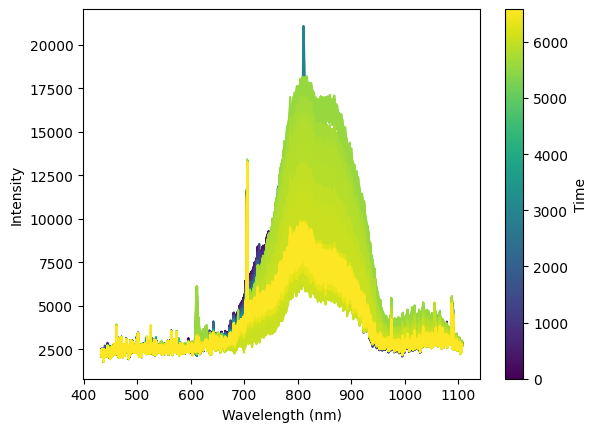

Loading LWP481_Ws_03Jan2017.mat


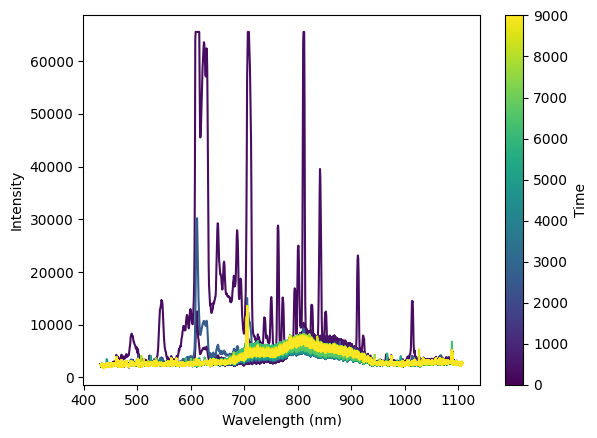

Loading LWP481_Ws_04Jan2017.mat


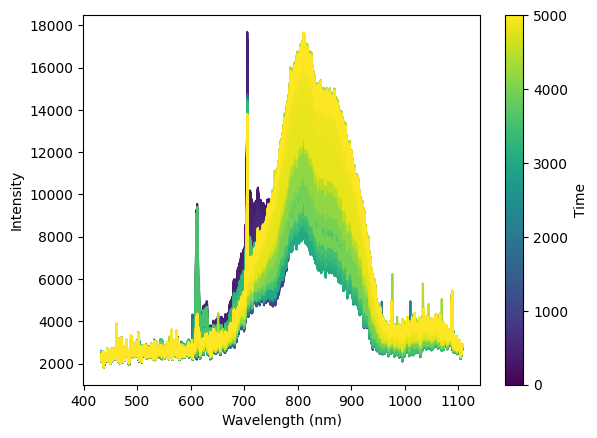

Loading LWP484_Ws_23Jan2017.mat


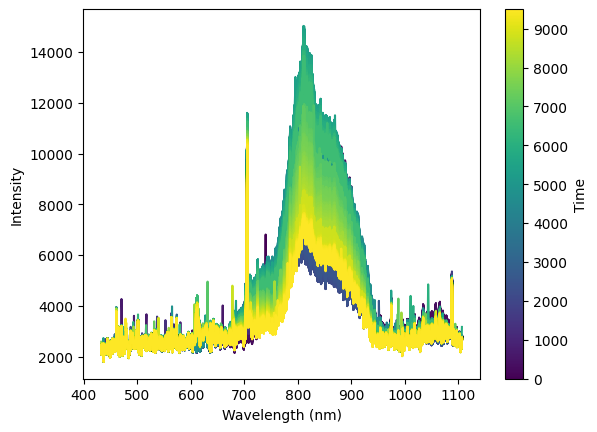

Loading LWP484_Ws_24Jan2017.mat


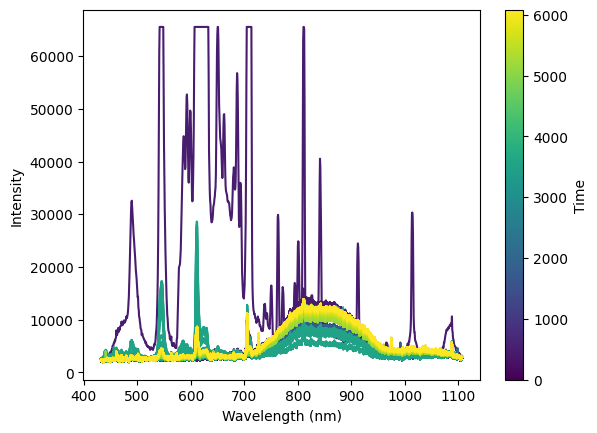

Loading LWP485_Ws_30Jan2017.mat


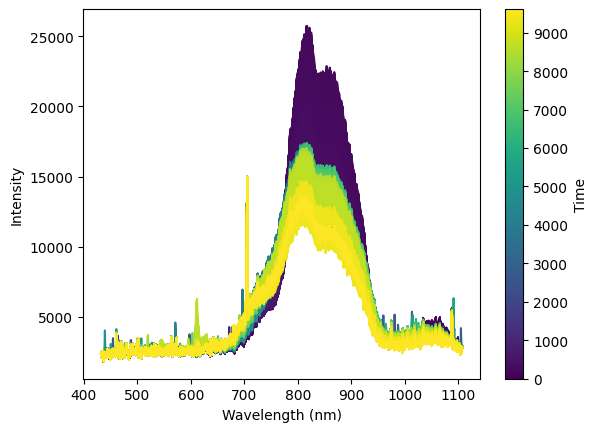

Loading LWP488_Ws_13Feb2017.mat


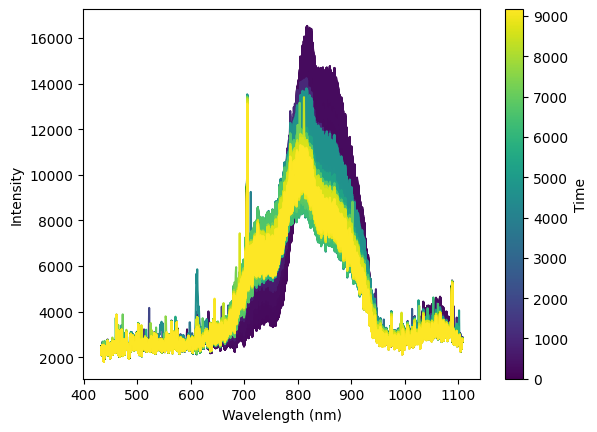

Loading LWP489_Ws_20Feb2017.mat


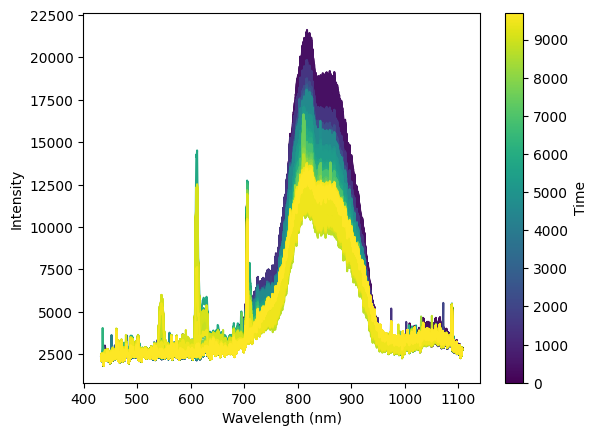

Loading LWP490_Ws_27Feb2017.mat


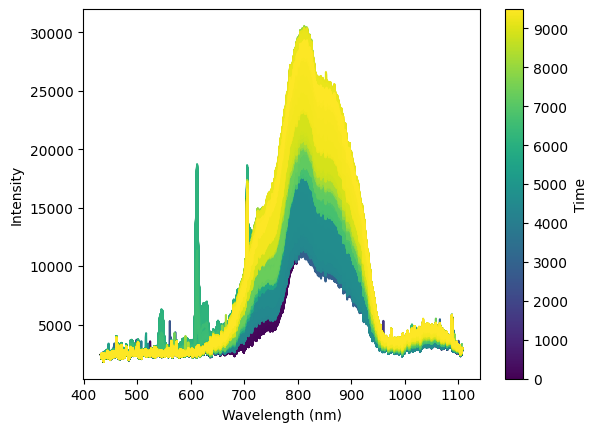

Loading LWP490_Ws_28Feb2017.mat


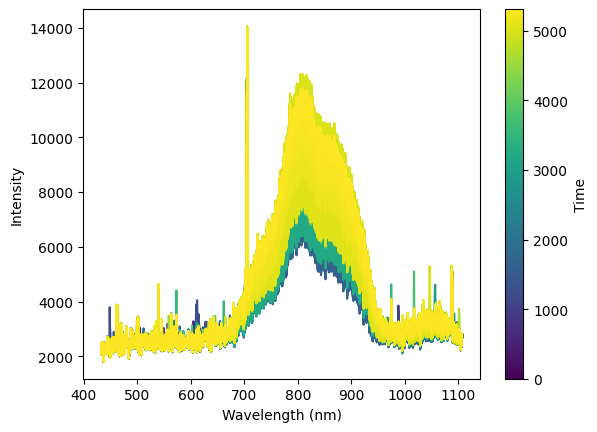

Loading LWP491_Ws_06Mar2017.mat


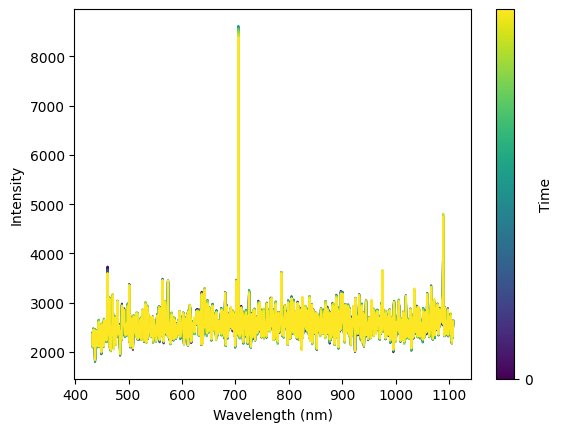

Loading LWP491_Ws_06Mar2017CJB.mat


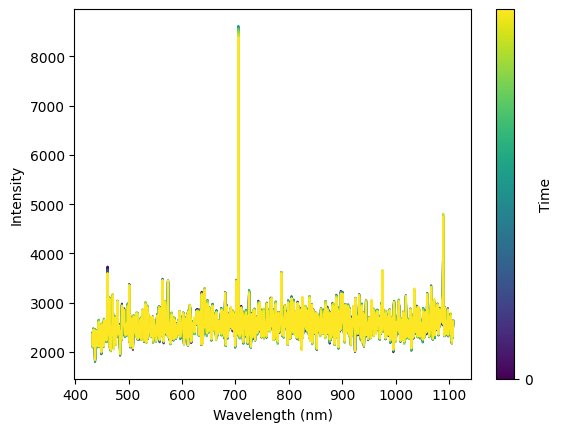

Loading LWP492_Ws_13Mar2017.mat


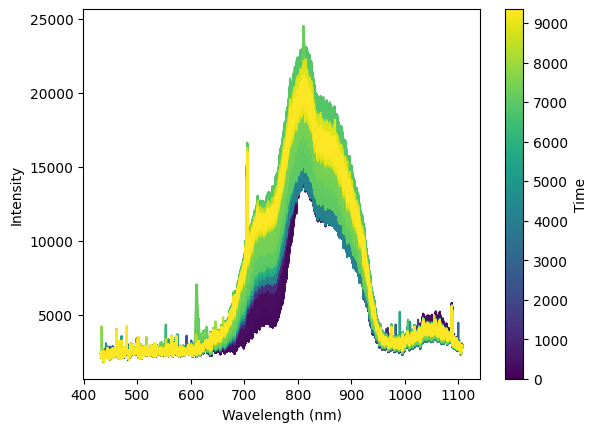

Loading LWP493_Ws_20Mar2017.mat


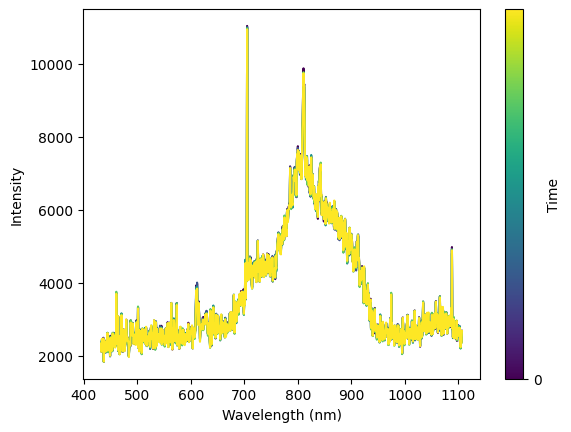

Loading LWP494_Ws_27Mar2017_17  21.mat


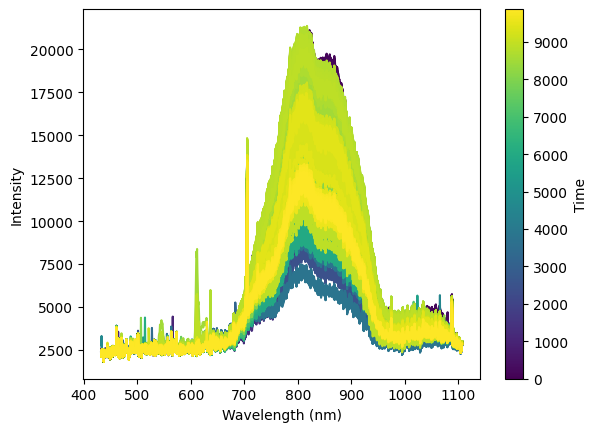

Loading LWP495_Ws_03Apr2017_12  29.mat


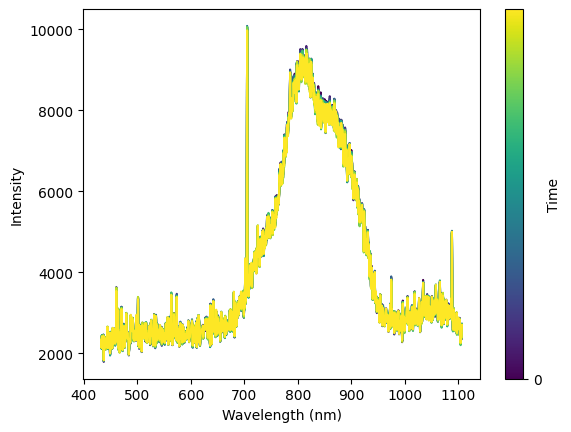

Loading LWP495_Ws_03Apr2017_12  34.mat


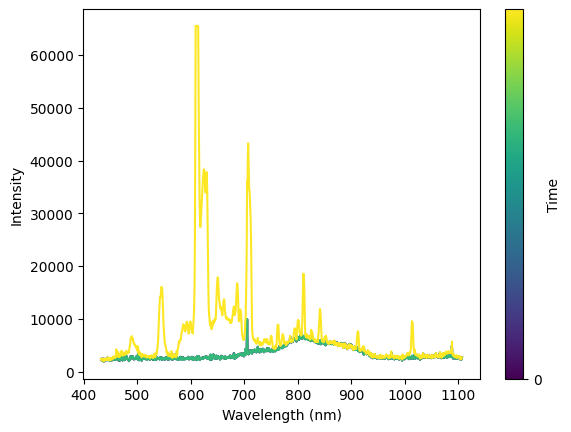

Loading LWP495_Ws_03Apr2017_12  46.mat


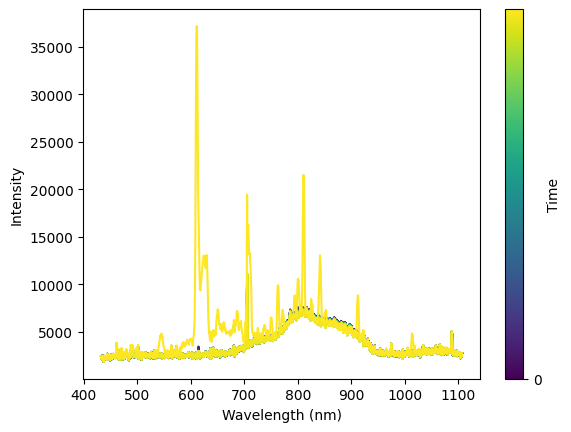

Loading LWP495_Ws_03Apr2017_14  23.mat


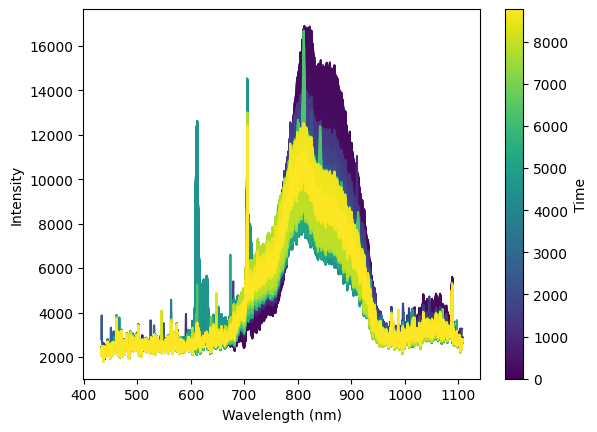

Loading LWP498_Ws_24Apr2017_12.mat


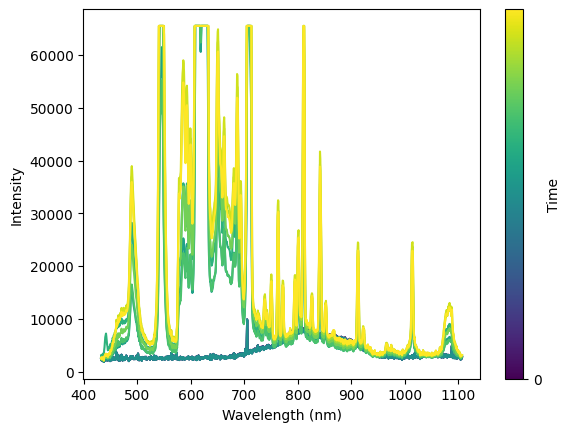

Loading LWP498_Ws_24Apr2017_15.mat


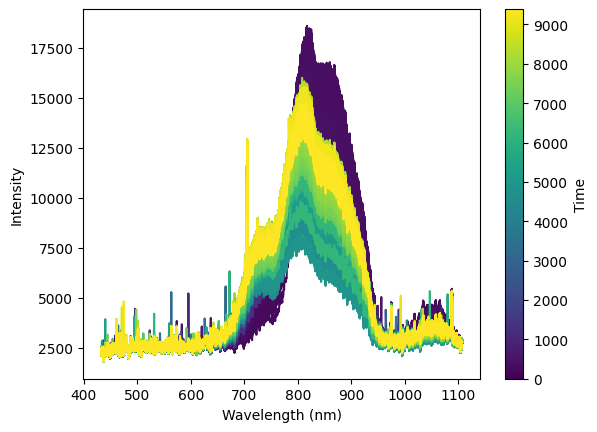

Loading LWP498_Ws_25Apr2017_16.mat


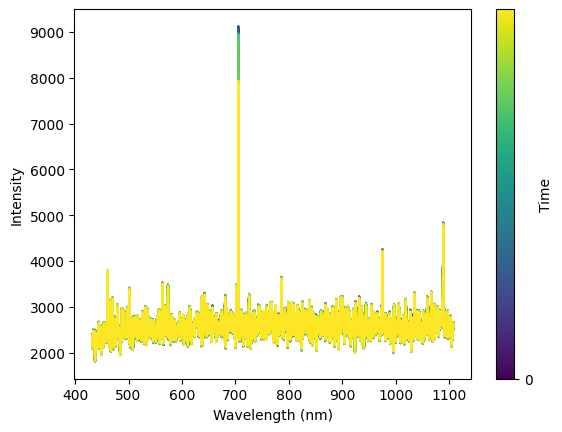

Loading LWP499_Ws_02_May_2017.mat


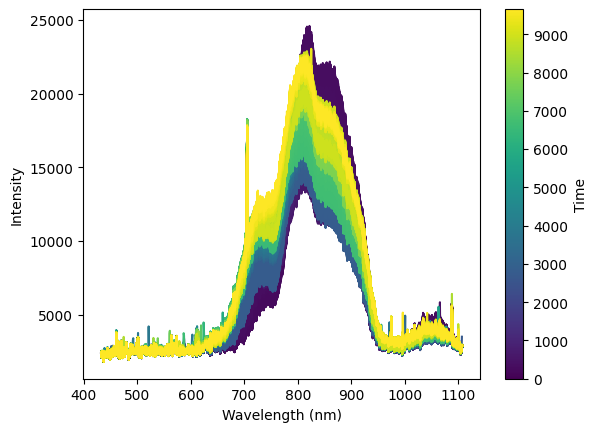

Loading LWP500_Ws_15_May_201713.mat


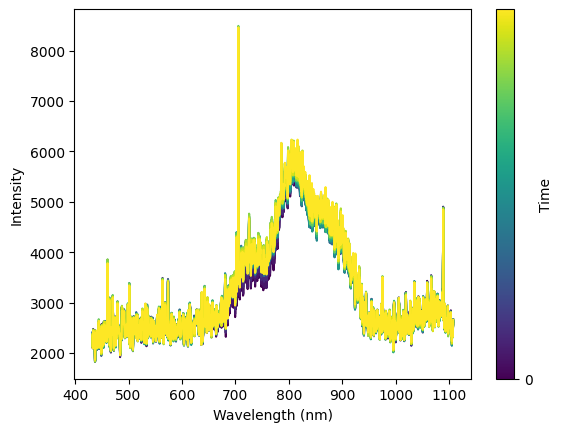

Loading LWP500_Ws_15_May_201716.mat


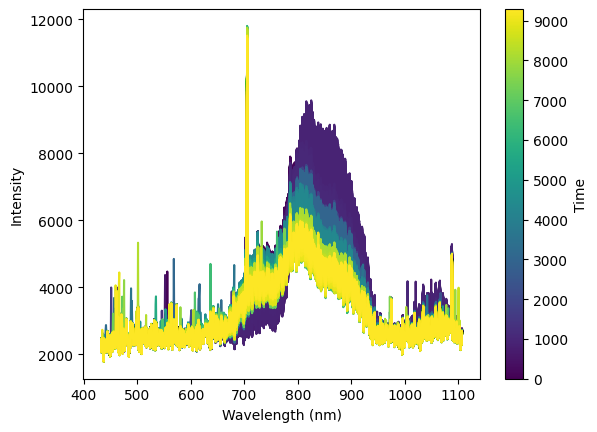

Loading LWP501_Ws_22_May_201711.mat


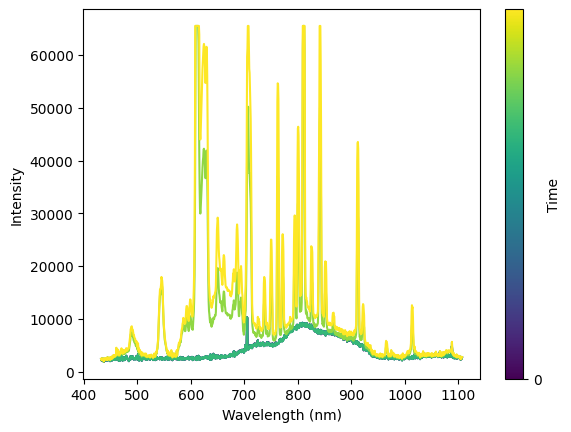

Loading LWP501_Ws_22_May_201715.mat


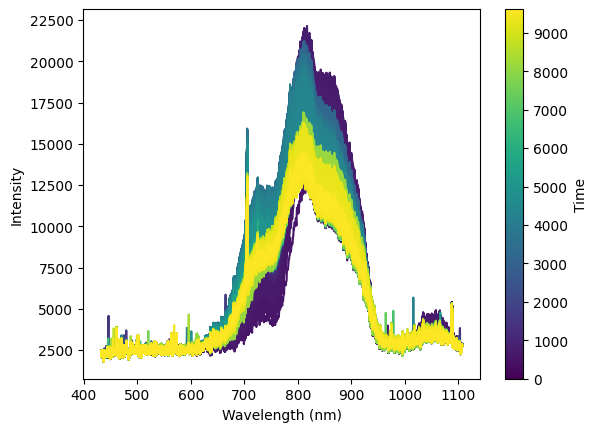

Loading LWP502_Ws_30_May_201716.mat


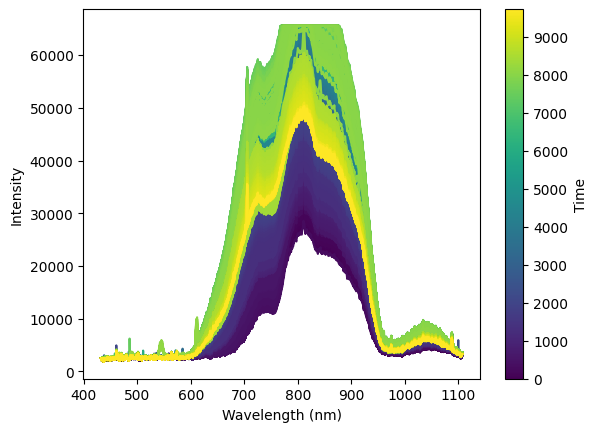

Loading LWP503_Ws_05_Jun_2017_15   8.mat


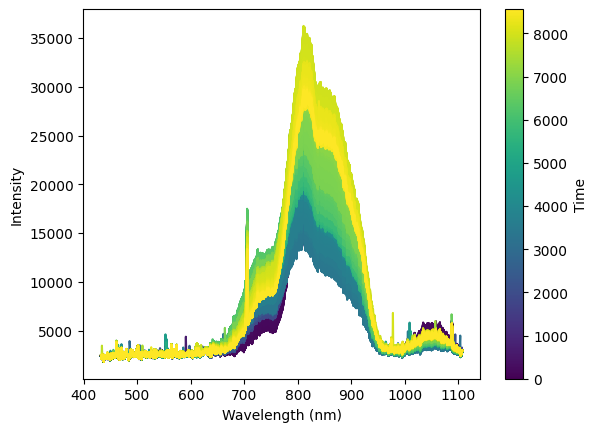

Loading LWP503_Ws_05_Jun_2017_15  23.mat


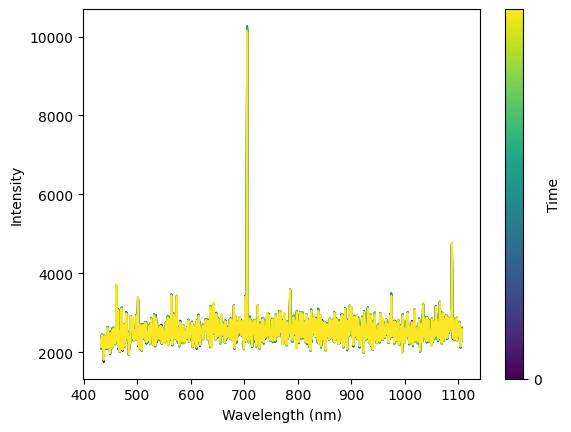

Loading LWP503_Ws_06_Jun_2017_15  18.mat


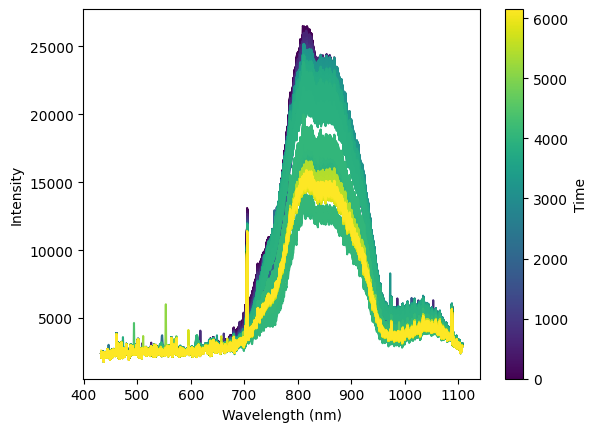

Loading LWP504_Ws_12Jun_2017_17   1.mat


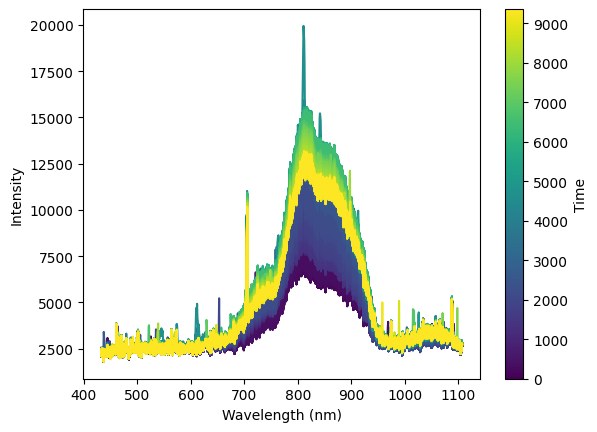

Loading LWP507_Ws_10Jul_2017_16  55.mat


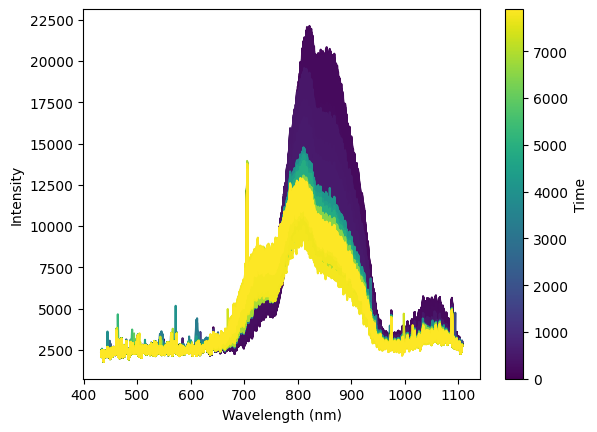

Loading LWP509_Ws_17Jul_2017_11  21.mat


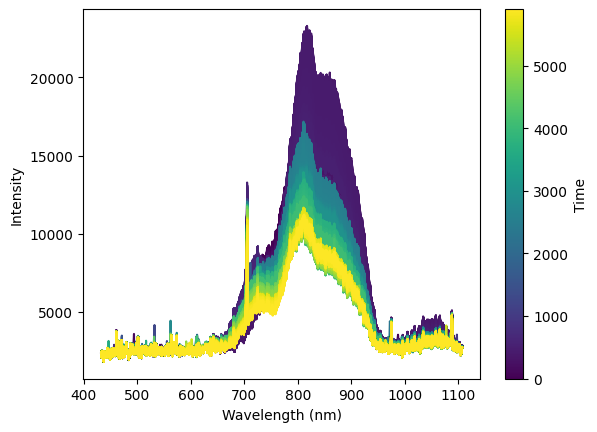

Loading LWP509_Ws_17Jul_2017_18  18.mat


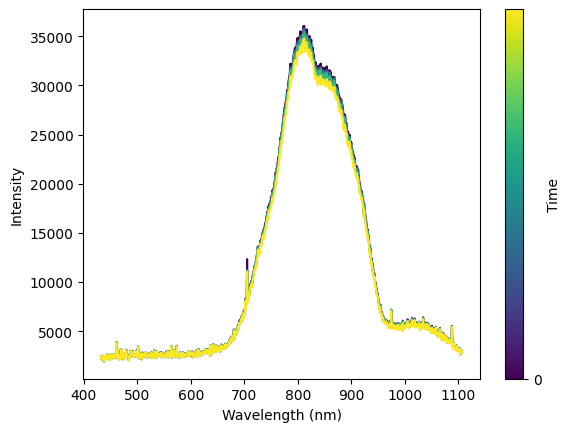

Loading LWP511_Ws_25Jul_2017_16   2.mat


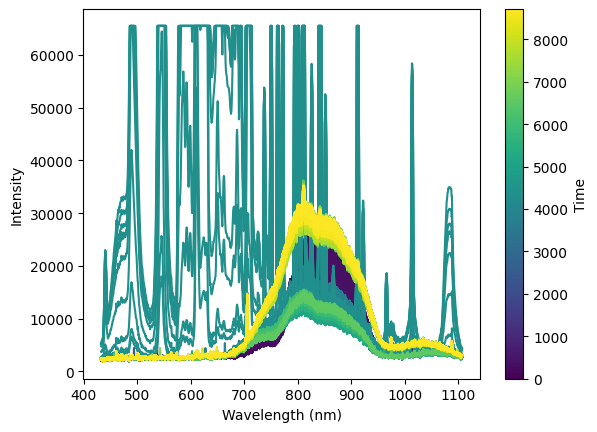

Loading LWP511_Ws_26Jul_2017_16   8.mat


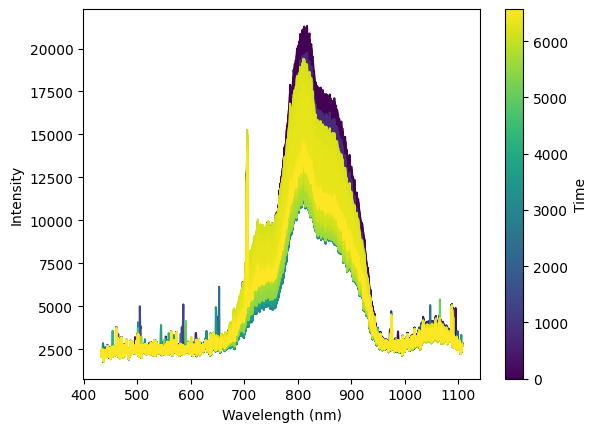

Loading LWP512_Ws_01AUG_2017_12  48.mat


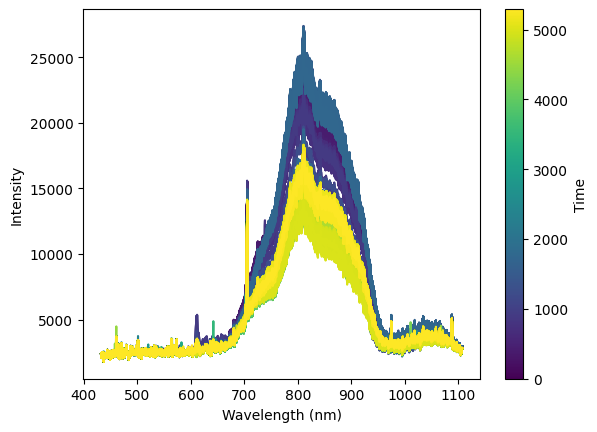

Loading LWP512_Ws_31Jul_2017_17  16.mat


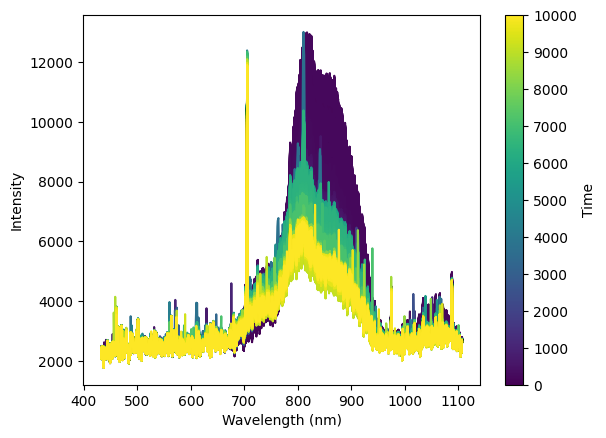

In [15]:
# iterate though all directories in ../datasets/piglet
dataset_path = "../../datasets/piglet/"
for pig in os.listdir(dataset_path):
    # iterate though all files in the directory and check if they are .mat files and contain ws in the filename
    if not os.path.isdir(dataset_path + pig):
        continue
    for file in os.listdir(dataset_path + pig):
        # print(file)
        if "_Ws" in file and file.endswith(".mat")::
            # load the data
            print("Loading " + file)
            img_mat = scipy.io.loadmat(dataset_path + pig + "/" + file)
            wavelengths = img_mat['wavelengths'].astype(float)
            spectr = img_mat['spectralDataAll'].astype(float)

            # plot the spectrum
            fig, ax = plot_spectrum(spectr, wavelengths)
            fig.savefig(dataset_path + pig + "/" + file.split(".mat")[0] + ".png")

### Plot all white and dark references and concentration changes

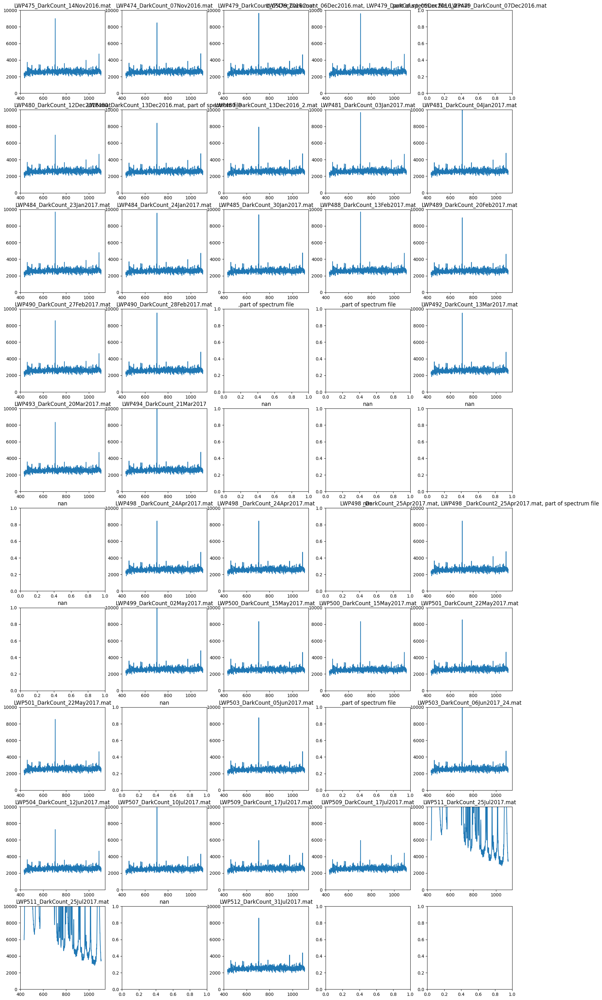

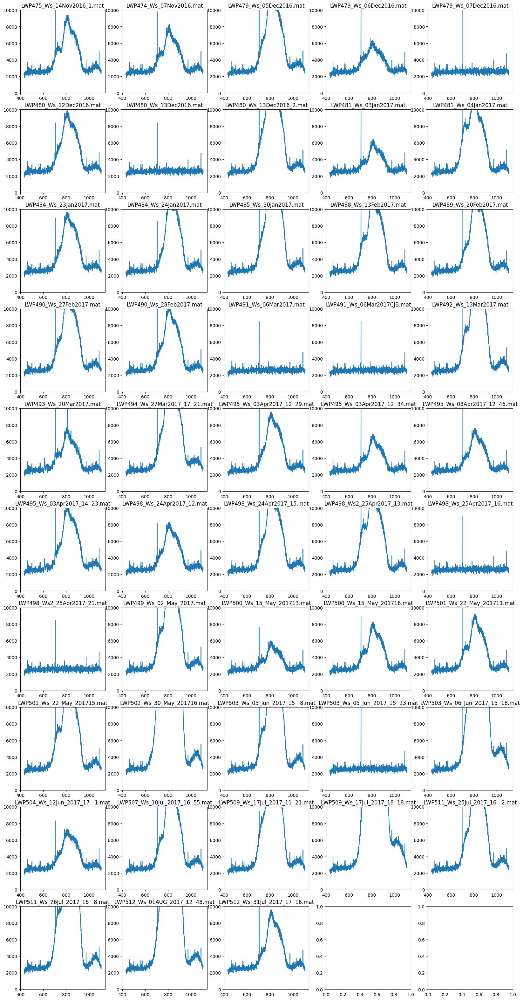

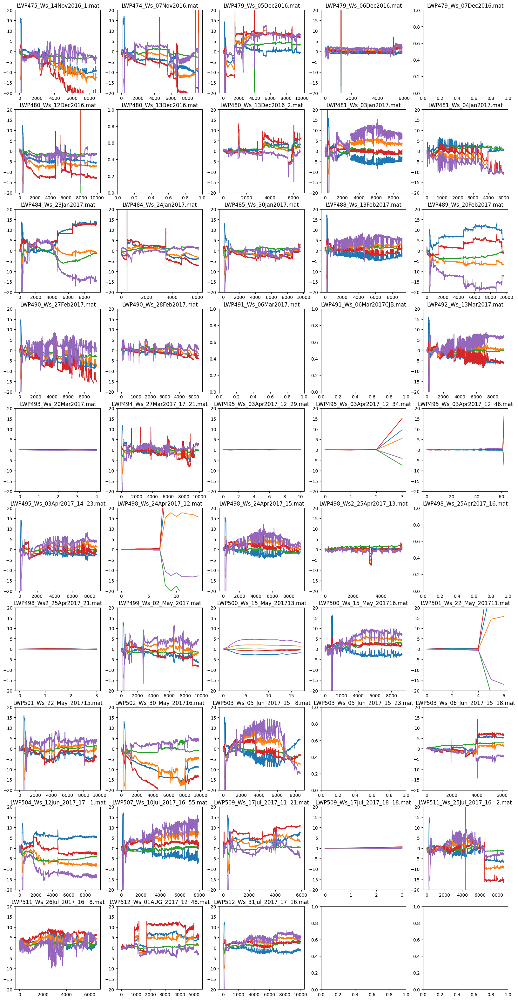

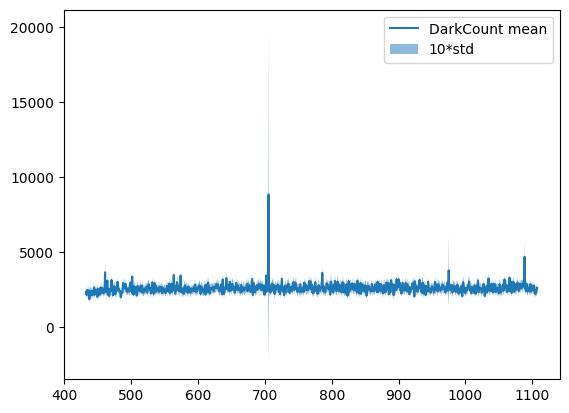

In [16]:
xlsx_path = "overview.xlsx"
df = pd.read_excel(xlsx_path, sheet_name="Sheet1", engine="openpyxl")

fig_dark, ax_dark = plt.subplots(10,5, figsize=(20,40))
fig_white, ax_white = plt.subplots(10,5, figsize=(20,40))
fig_concentration, ax_concentration = plt.subplots(10,5, figsize=(20,40))

dark_imgs = []
for i in range(len(df)):
    path = f"../../datasets/piglet/{df.piglet[i]}"
    ax_dark[i//5, i%5].set_title(df.darkCount[i], fontsize=12)
    ax_white[i//5, i%5].set_title(df.spectrum[i], fontsize=12)
    ax_concentration[i//5, i%5].set_title(df.spectrum[i], fontsize=12)

    img_mat = scipy.io.loadmat(path + "/" + df.spectrum[i])
    white_img = img_mat['refIntensity'].astype(float)
    white_img = np.mean(white_img, axis=1)
    ax_white[i//5, i%5].plot(wavelengths, white_img)
    ax_white[i//5, i%5].set_ylim([0, 10000])

    # check if the concentration is in the file
    if "Results" in img_mat:
        concentration = img_mat["Results"]["AllConcentration"][0][0][0][0]
        ax_concentration[i//5, i%5].plot(concentration)
        ax_concentration[i//5, i%5].set_ylim([-20,20])

    filename = str(df.darkCount[i]).split(",")[0]
    if not filename.startswith("LWP"):
        continue
    dark_img = scipy.io.loadmat(path + "/" + filename)['DarkCount'].astype(float)
    dark_img = np.mean(dark_img, axis=1)
    ax_dark[i//5, i%5].plot(wavelengths, dark_img)
    ax_dark[i//5, i%5].set_ylim([0, 10000])

    if df.piglet[i] != "LWP511":
        dark_imgs.append(dark_img)



# plot mean and std as area of dark images
plt.figure()
dark_imgs = np.array(dark_imgs)
dark_imgs_mean = np.mean(dark_imgs, axis=0)
dark_imgs_std = np.std(dark_imgs, axis=0)
plt.plot(wavelengths, dark_imgs_mean, label="DarkCount mean")
plt.fill_between(wavelengths.squeeze(), dark_imgs_mean - 10*dark_imgs_std, dark_imgs_mean + 10*dark_imgs_std, alpha=0.5, label="10*std")
plt.legend()


C:\Users\User\AppData\Local\Temp\ipykernel_20324\4093735758.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,3, figsize=(20,5))


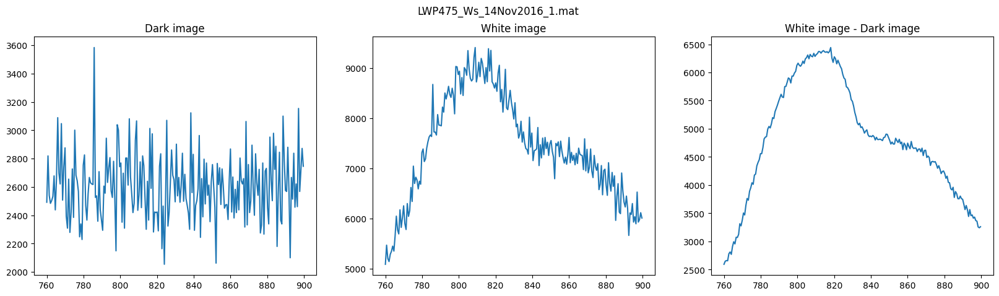

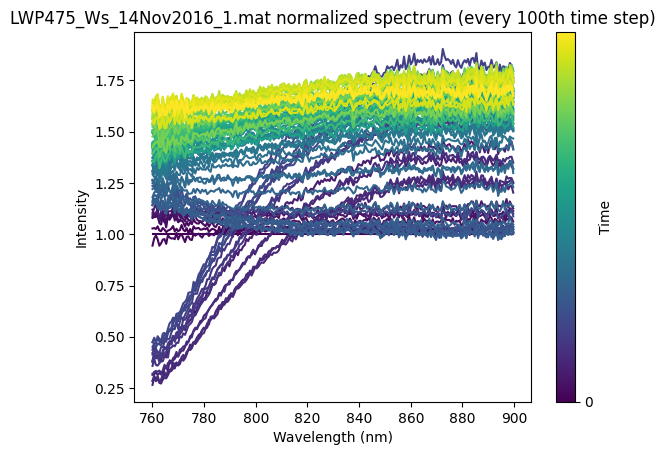

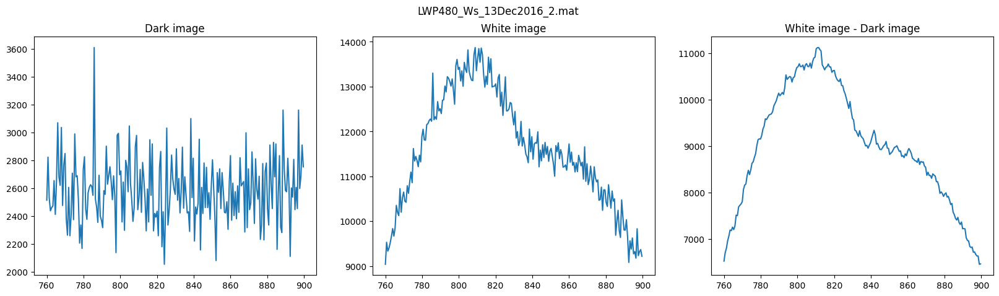

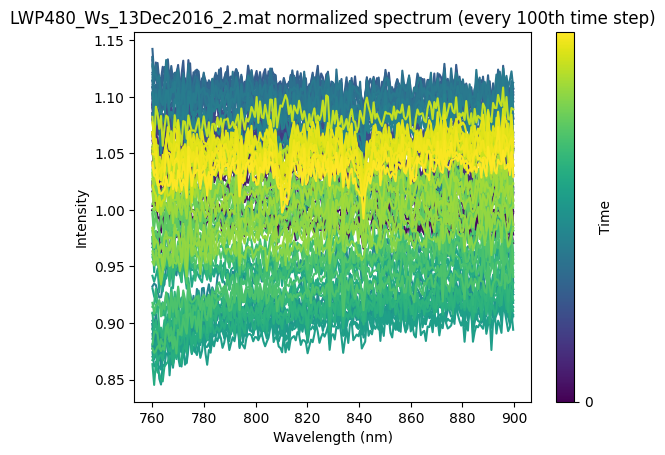

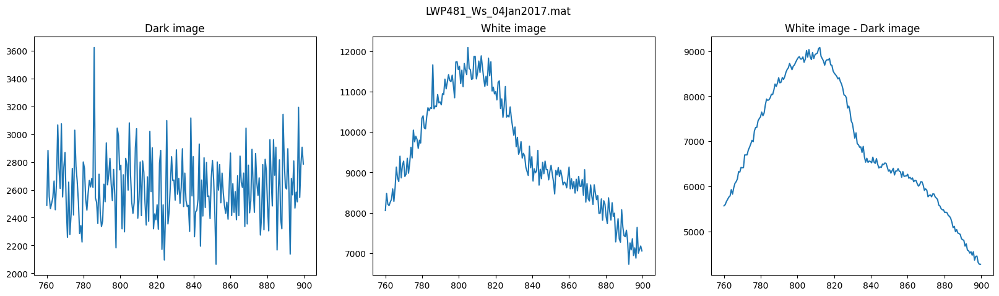

...

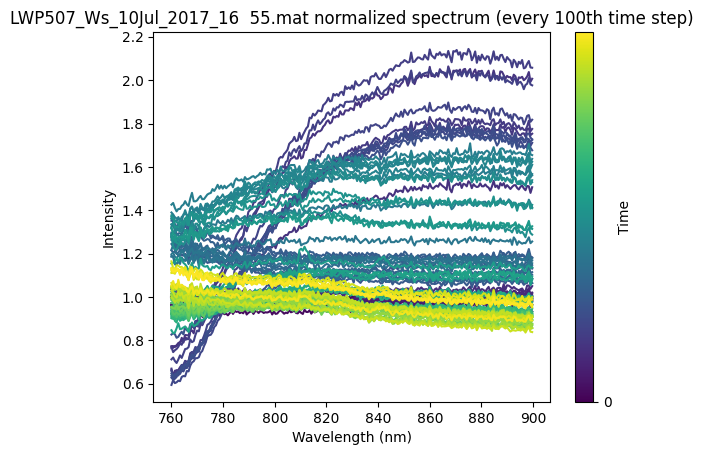

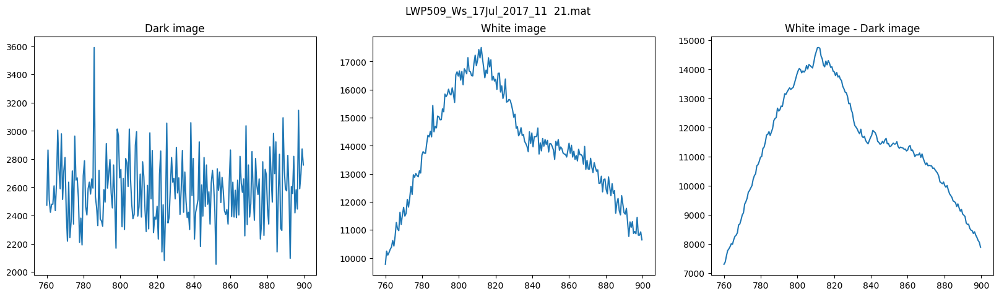

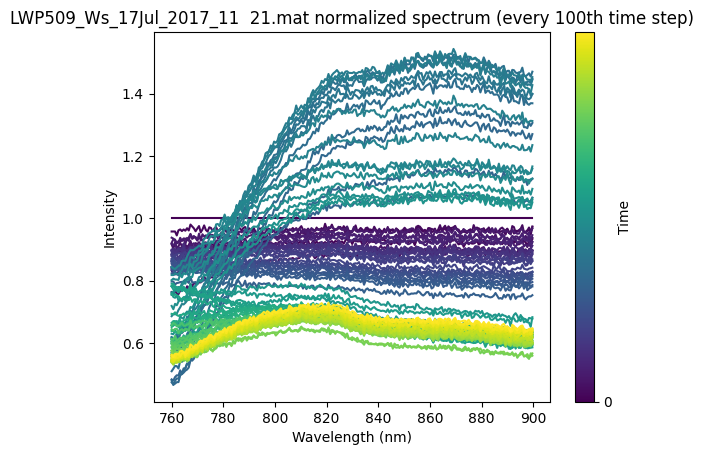

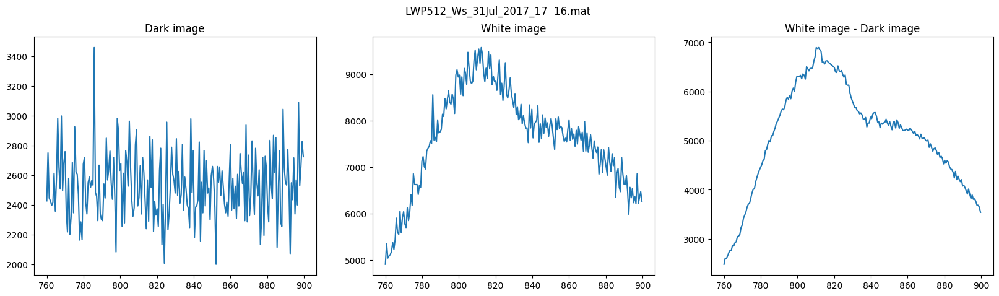

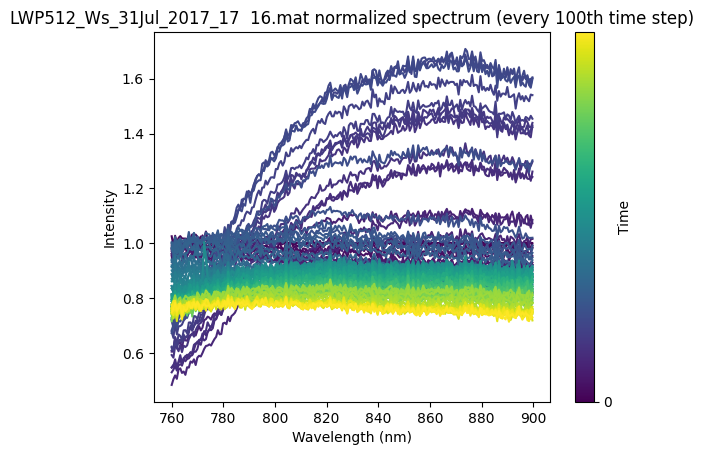

In [17]:
xlsx_path = "overview.xlsx"
df = pd.read_excel(xlsx_path, sheet_name="Sheet1", engine="openpyxl")

dataset_path = "../../datasets/piglet/"
for i in range(len(df)):

    if df.good[i] == "No" or df.good[i] == "?":
        continue

    piglet = df.piglet[i]

    img_mat = scipy.io.loadmat(dataset_path + piglet + "/" + df.spectrum[i])
    wavelengths = img_mat['wavelengths'].astype(float)
    white_img = img_mat['refIntensity'].astype(float)
    spectr = img_mat['spectralDataAll'].astype(float)
    dark_img = scipy.io.loadmat(dataset_path + piglet + "/" + df.darkCount[i])["DarkCount"].astype(float)

    # select wavelengths between 760 and 900
    idx = (wavelengths >= 760) & (wavelengths <= 900)
    wavelengths_cut = wavelengths[idx]
    spectr_cut = spectr[idx.squeeze()]
    white_img_cut = white_img[idx.squeeze()]
    dark_img_cut = dark_img[idx.squeeze()]

    # normalize the spectrum
    spectr_cut = (spectr_cut - dark_img_cut[:, 0, None]) / (white_img_cut[:, 0, None] - dark_img_cut[:, 0, None])

    # plot the spectrum
    fig, ax = plt.subplots(1,3, figsize=(20,5))
    plt.suptitle(df.spectrum[i])
    ax[0].plot(wavelengths_cut, dark_img_cut[:, 0, None])
    ax[0].set_title("Dark image")
    ax[1].plot(wavelengths_cut, white_img_cut[:, 0, None])
    ax[1].set_title("White image")
    ax[2].plot(wavelengths_cut, white_img_cut[:, 0, None] - dark_img_cut[:, 0, None])
    ax[2].set_title("White image - Dark image")
    fig, ax = plot_spectrum(spectr_cut[:,0:1000:10], wavelengths_cut)
    ax.set_title(f"{df.spectrum[i]} normalized spectrum (every 100th time step)", fontsize=12)
    # ax.set_ylim([0, 8])
    # fig.savefig(dataset_path + pig + "/" + file.split(".mat")[0] + "_normalized.png")

C:\Users\User\AppData\Local\Temp\ipykernel_20324\2619125541.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


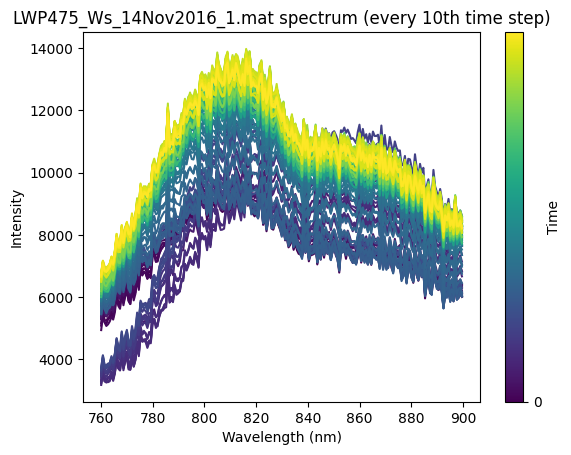

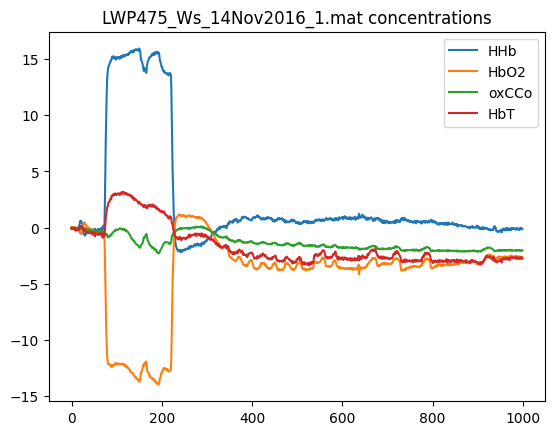

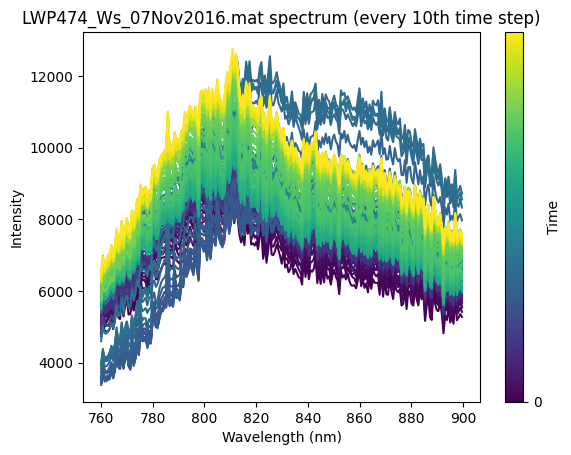

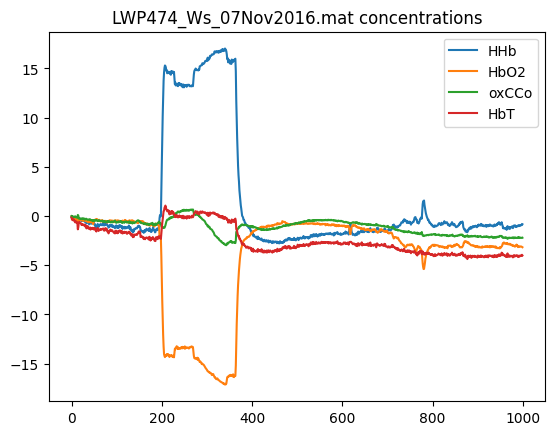

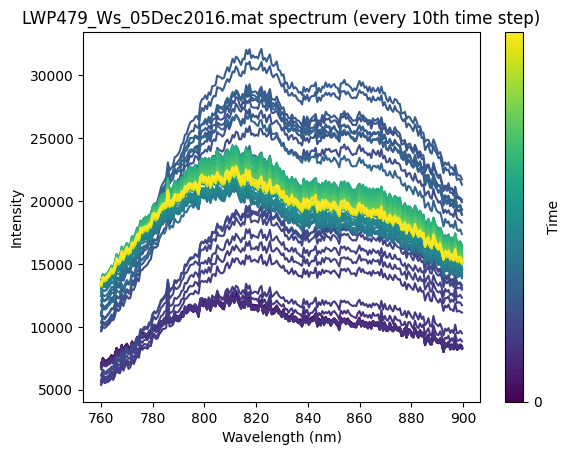

...

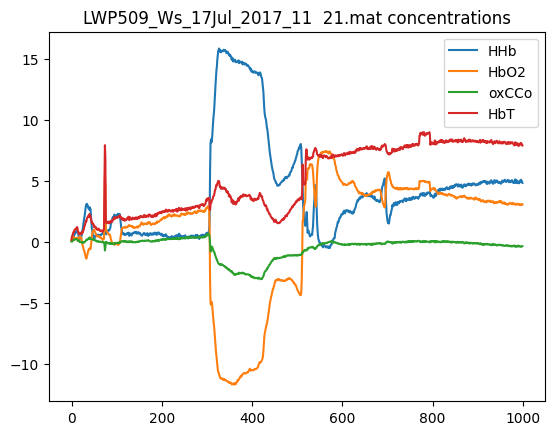

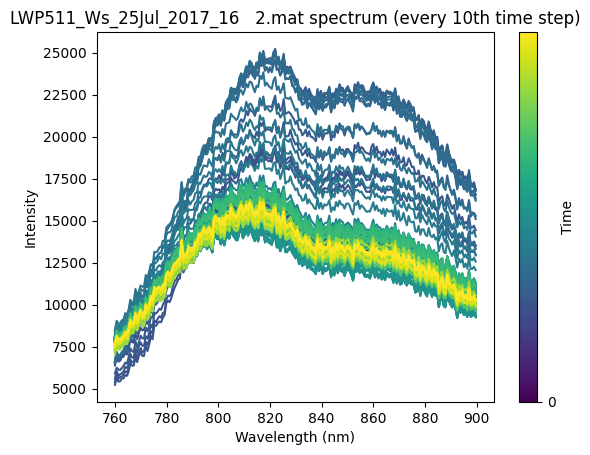

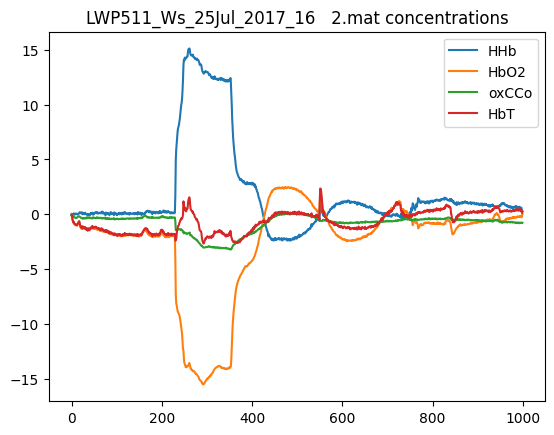

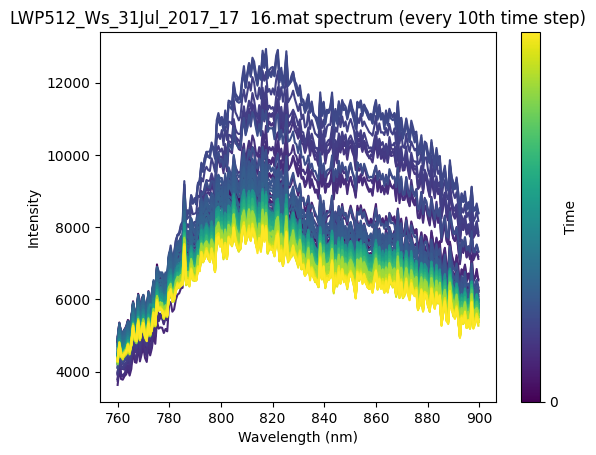

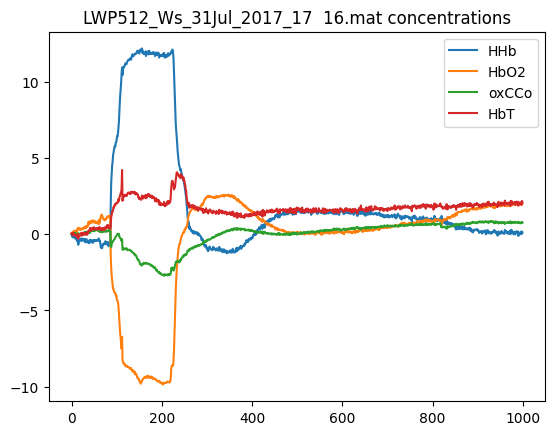

In [27]:
xlsx_path = "overview.xlsx"
df = pd.read_excel(xlsx_path, sheet_name="Sheet1", engine="openpyxl")

dataset_path = "../../datasets/piglet/"
for i in range(len(df)):

    if df.good[i] != "Yes":
        continue

    piglet = df.piglet[i]

    img_mat = scipy.io.loadmat(dataset_path + piglet + "/" + df.spectrum[i])
    wavelengths = img_mat['wavelengths'].astype(float)
    spectr = img_mat['spectralDataAll'].astype(float)
    concentrations = img_mat['allConcent'].astype(float)

    # select wavelengths between 760 and 900
    idx = (wavelengths >= 760) & (wavelengths <= 900)
    wavelengths_cut = wavelengths[idx]
    spectr_cut = spectr[idx.squeeze()]

    # plot the spectrum
    fig, ax = plot_spectrum(spectr_cut[:,0:1000:10], wavelengths_cut)
    ax.set_title(f"{df.spectrum[i]} spectrum (every 10th time step)", fontsize=12)
    fig, ax = plt.subplots()
    ax.plot(concentrations.T[:1000,:4], label=["HHb","HbO2","oxCCo","HbT"])
    ax.set_title(f"{df.spectrum[i]} concentrations", fontsize=12)
    ax.legend()